In [73]:
import matplotlib.pyplot as plt 
import pandas as pd 

In [242]:
import numpy as np
from ripser import ripser
from persim import plot_diagrams
from gtda.diagrams import PersistenceEntropy, PairwiseDistance
from gtda.diagrams import Silhouette
from gtda.diagrams import BettiCurve 
from gtda.time_series import TakensEmbedding, SlidingWindow
import plotly.express as px
from sklearn.metrics import mutual_info_score
from gtda.metaestimators import CollectionTransformer
from gtda.pipeline import Pipeline
from gtda.plotting import plot_heatmap


## TDA of white Noise 

First we test how topological data analysis (TDA) performs on noisey stationary timeseries (structureless). Let's create a white noise timeseries for benchmarking the TDA perfomances.

<AxesSubplot:xlabel='signal', ylabel='count'>

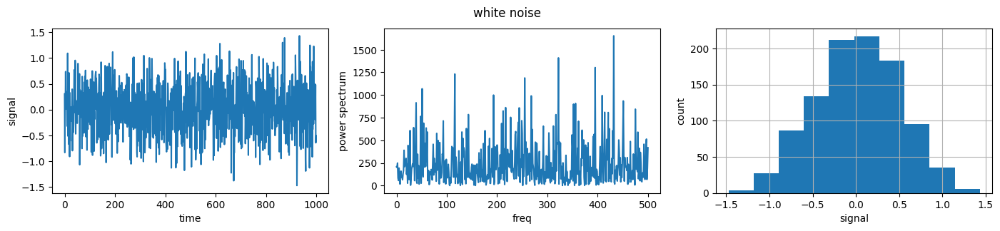

In [75]:
from random import gauss
from random import seed
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.gofplots import qqplot

# seed random number generator
seed(123456)
# create white noise series
white_noise_gen = [gauss(0.0, .50) for i in range(1000)]
white_noise = pd.Series(white_noise_gen)

# I am assuming 1000 points sampled every 10s (sampling frequency 0.1Hz)
# therefore the sampling frequency after the FFT is 0.1/1000 = 1e-4 Hz

fig_wn, data = plt.subplots(1, 3, figsize=(17, 3))

fig_wn.suptitle('white noise')
data[0].set_xlabel('time')
data[0].set_ylabel('signal')
data[1].set_xlabel('freq')
data[1].set_ylabel('power spectrum')
data[2].set_xlabel('signal')
data[2].set_ylabel('count')

fft_wn = np.fft.rfft(white_noise)
fft_wn_abs = np.abs(fft_wn)
power_spectrum_wn = np.square(fft_wn_abs)


data[0].plot(white_noise)
data[1].plot(power_spectrum_wn)
white_noise.hist()


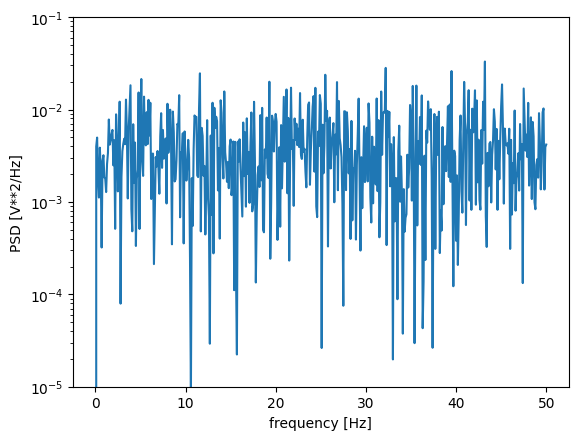

In [76]:
from scipy import signal

f, Pxx_den = signal.periodogram(white_noise, 100)
plt.semilogy(f, Pxx_den)
plt.ylim([1e-5, 1e-1])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

# the frequency index should be fixed... 

The power spectrum is pretty flat, so it looks good as white noise. 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



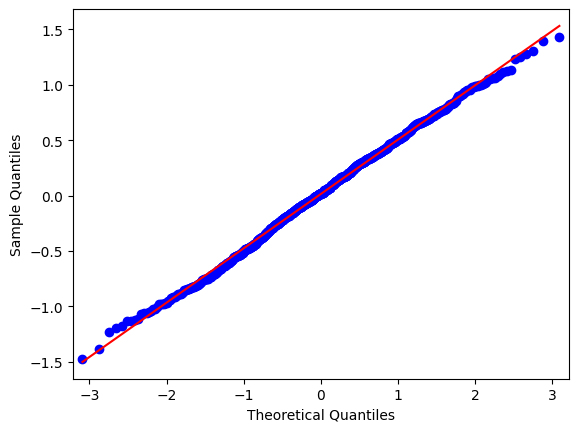

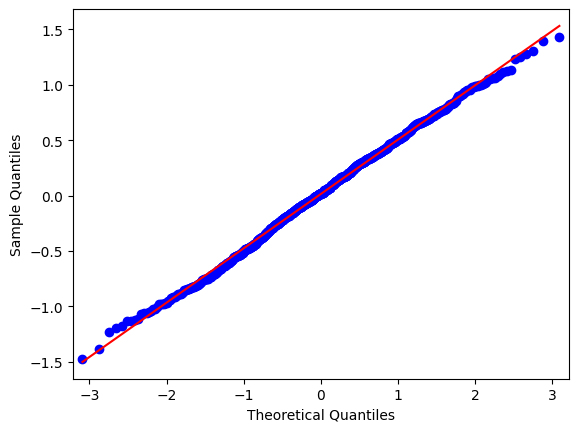

In [77]:
qqplot(white_noise, line='s')

In [78]:
from scipy.stats import anderson

# normality test
result = anderson(white_noise)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 0.537
15.000: 0.574, data looks normal (fail to reject H0)
10.000: 0.653, data looks normal (fail to reject H0)
5.000: 0.784, data looks normal (fail to reject H0)
2.500: 0.914, data looks normal (fail to reject H0)
1.000: 1.088, data looks normal (fail to reject H0)


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

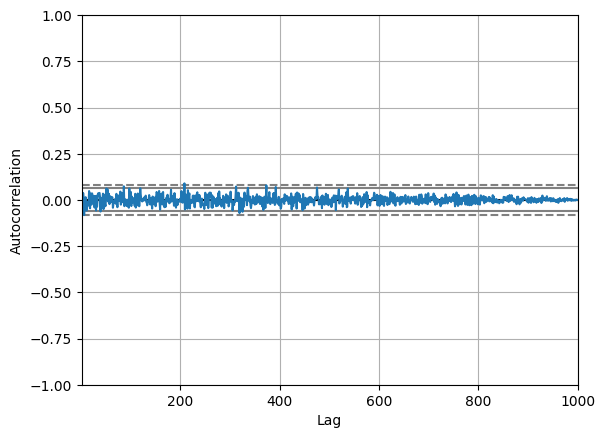

In [79]:
from pandas.plotting import autocorrelation_plot
from scipy import signal

autocorrelation_plot(white_noise)


As well, the noise is uncorrellated and Gaussian.

Now, we compute the optimal parameters for the Takens' embedding: the time delay, and the embedding dimension. 
These are computed through some euristhics. For the time delay, we pick the delay corresponding to the first
minimum in the mutual information function (ref), while for the dimension we look at the number of false nearest
neighbours. For white noise these should be meaningless, as the embedding is design to reproduce the attractor 
(i.e. information) contained in a timeseries, while noise does not contain any attractor.
The point cloud should then be Gaussian distributed in d-dimensions. 

In [80]:
from gtda.time_series import SingleTakensEmbedding, takens_embedding_optimal_parameters
from sklearn.decomposition import PCA
from gtda.plotting import plot_point_cloud

print('length of signal to analyze', len(white_noise_gen))

max_time_delay = 50 
max_embedding_dimension = 20
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    white_noise_gen, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_wn_embedded = embedder.fit_transform(white_noise_gen)

pca = PCA(n_components=3)
y_wn_embedded_pca = pca.fit_transform(y_wn_embedded)

plot_point_cloud(y_wn_embedded_pca)

length of signal to analyze 1000
Optimal embedding time delay based on mutual information: 2
Optimal embedding dimension based on false nearest neighbors: 6


In [81]:
def mutual_information(X, time_delay, n_bins):
    """Calculate the mutual information given the time delay."""
    contingency = np.histogram2d(X[:-time_delay], X[time_delay:],
                                 bins=n_bins)[0]
    mutual_information = mutual_info_score(None, None,
                                           contingency=contingency)
    return mutual_information


    mutual_information_list = Parallel(n_jobs=n_jobs)(
        delayed(_mutual_information)(X, time_delay, n_bins=100)
        for time_delay in range(1, max_time_delay + 1))
    time_delay = \
        mutual_information_list.index(min(mutual_information_list)) + 1
    
    print('mutual information list',mutual_information_list )


    return time_delay, dimension

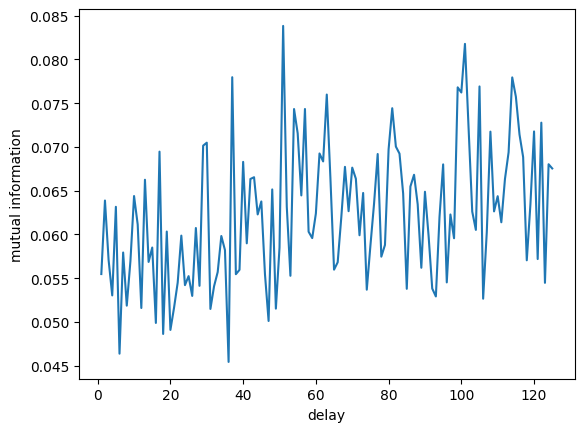

In [82]:
max_time_delay = 125
bins = len(white_noise_gen)/100

X = white_noise_gen
mutual_information_list = []

for time_delay in range(1, max_time_delay + 1):
    mutual_information_list.append(mutual_information(X, time_delay, n_bins=12))
           

plt.plot(range(1,max_time_delay+1),mutual_information_list);
plt.xlabel('delay');
plt.ylabel('mutual information');

Good, there is no really a minimum in the mutual information of the timeseries, because this is only noise and 
there is no actual information hidden in it.

In this case, the embedding dimension and the optimal time delay are arbitraty. 

In [83]:
from gtda.homology import VietorisRipsPersistence
homology_dimensions = (0, 1, 2)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)


y_wn_embedded_reshaped = y_wn_embedded.reshape(1, *y_wn_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",y_wn_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", y_wn_embedded.shape)


PerHom_wn = VRP.fit_transform(y_wn_embedded_reshaped)
VRP.plot(PerHom_wn)

y_wn_embedded_reshaped.shape (1, 990, 6)
y_wn_embedded.shape (990, 6)


As expected the persistence diagram has 0-dimasional components that are Gaussian distributed, and higher 
dimensionality points are just representing noise.

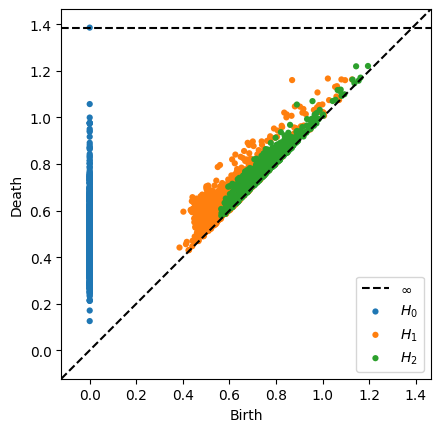

In [84]:
from ripser import ripser
from persim import plot_diagrams

dgms = ripser(y_wn_embedded, maxdim=2)['dgms']
plot_diagrams(dgms, show=True)

The Takens embedding of a white noise (univariate) time-series gives rise to a n-dimensional ball. The TDA of this object is mostly consisting of points of low persistence, lying close to the diagonal in the persistent homology diagram. 
The the TDA of the n-dimensional ball is therefore a representation of noise: more rigorously, one can define a confidence interval for a given dataset corresponding to a band around the diagonal of the persistence diagram.
The points outside the band are then considered as significant topological features. The width of such confidence band can be estimated rigorously (see Fasy et al. "confidence sets for persistence diagrams", Ann. Statistics (2014) for more details). Other approaches to separate noise from significant data are e.g. the widest gap from the diagonal, from V. Kurlin "A fast persistence-based segmentation of noisy 2D clouds with provable guarantees" Pattern Recognition (2015).

In [85]:
PE_wn = PersistenceEntropy()
features_wn = PE_wn.fit_transform(PerHom_wn)
print('Persistence Entropy of white noise')
print('Entropy homology class H0:', features_wn[0][0])
print('Entropy homology class H1:', features_wn[0][1])
print('Entropy homology class H2:', features_wn[0][2])

Persistence Entropy of white noise
Entropy homology class H0: 9.897425025655581
Entropy homology class H1: 9.534175612659949
Entropy homology class H2: 8.966802351623757


Normalized Shannon entropies are computed follwing: A. Myers, E. Munch, and F. A. Khasawneh, *“Persistent Homology of Complex Networks for Dynamic State Detection”*, Phys. Rev. E 100, 022314, (2019)

According to Myers *et al.* (2019) in order to compare entropies with from persistence diagrams with different number of points the persistent entropy should be normalised as follows:
$$ E'(D) = \frac{E(D)}{\log_2 \mathcal{L}(D)} \qquad  \mathcal{L}(D) = \sum_{x \in D} pers(x) = \sum_{x \in D} 
death_x - birth_x$$  

In [86]:
PE_wn_norm = PersistenceEntropy(normalize=True)
features_wn_norm = PE_wn_norm.fit_transform(PerHom_wn)
print('Persistence Entropy of white noise')
print('Entropy (normalized) homology class H0:', features_wn_norm[0][0])
print('Entropy (normalized) homology class H1:', features_wn_norm[0][1])
print('Entropy (normalized) homology class H2:', features_wn_norm[0][2])

Persistence Entropy of white noise
Entropy (normalized) homology class H0: 1.1113915392653817
Entropy (normalized) homology class H1: 1.594451625565508
Entropy (normalized) homology class H2: 2.009556950314497


In [87]:
Betti = BettiCurve()
Betti_wn = Betti.fit_transform_plot(PerHom_wn)

In [88]:
from gtda.diagrams import HeatKernel

HK = HeatKernel()
print(PerHom_wn.shape)
for i in [0,1,2]:
    HK_wn = HK.fit_transform_plot(PerHom_wn, homology_dimension_idx = i)


(1, 2703, 3)


In [89]:
from gtda.diagrams import PersistenceImage

PI = PersistenceImage()
for i in [0,1,2]:
    PI_wn = PI.fit_transform_plot(PerHom_wn, homology_dimension_idx = i)


Ok, it looks like an entropy in the range of 9 is associated with white noise. Can we be sure of this? Here generate many time series (500) and compute the entropy to get an average value. 

In [90]:
seed(654)
data = []
# create 200 white noise time series each of 1000 time steps. 
# the mean is zero and std dev is 1
for i in range(500):
    white_noise_gen = [gauss(0.0, 1.0) for i in range(1000)]
    white_noise = pd.Series(white_noise_gen)
    data.append(white_noise)
data_T = list(map(list, zip(*data)))
white_noise_df = pd.DataFrame.from_records(data_T)

In [91]:
white_noise_df

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,-0.528208,0.598606,0.993121,-0.661154,1.573523,-1.231968,-1.325217,-2.009721,1.509723,-0.646308,...,-0.565514,1.561503,0.790303,-0.488423,-0.451089,1.014721,0.939922,-0.969389,0.489419,0.354687
1,-0.830552,1.283154,0.310713,0.251406,-0.565561,0.154713,-0.584706,-0.026439,-0.270134,1.071327,...,-1.113554,-1.390579,1.179488,1.434752,-1.606222,1.288154,-0.515758,-0.285970,0.637529,-0.089111
2,-0.563503,-0.856284,-0.211764,0.537473,1.072403,1.891951,-2.280387,0.602359,-0.753450,1.464586,...,0.452774,0.334658,-0.735437,-0.461774,0.011444,-1.178934,0.768696,0.831250,1.588864,0.882568
3,1.305856,-2.484964,-2.484832,-0.791096,1.029989,0.320039,1.284230,0.494302,0.583287,-2.011011,...,-0.159611,1.213742,-0.502918,-0.662660,1.152134,1.494782,-1.980137,0.699526,-0.948459,-0.575668
4,1.220920,0.446869,0.276151,1.759766,-1.111147,1.337355,0.161584,-0.437460,-0.786802,-0.139928,...,0.356813,0.779256,-1.391069,0.121659,0.898495,-0.198211,-0.938429,0.284461,-0.752432,-0.303084
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.459767,-0.492837,0.081861,1.647690,-0.592251,0.556099,0.438764,-1.842588,-1.365802,-0.245016,...,-1.149790,-0.419699,1.266238,0.303304,0.789096,-0.571049,-0.784797,-0.410569,0.456492,-1.122397
996,0.367220,1.136337,0.399292,-0.645000,-0.996136,-1.510419,2.288459,-0.505004,-0.405323,1.437879,...,-0.182576,0.004344,0.006676,-0.643766,-0.400937,-0.132848,1.843546,0.095060,-1.184319,0.578355
997,-0.043268,0.256607,0.590157,-0.882763,-0.759998,0.717717,-1.277625,1.059064,-0.208410,0.052545,...,2.306520,0.998920,-0.350614,-1.345988,-0.984979,-0.384798,0.181537,0.881497,-1.756374,0.531090
998,-0.546773,1.828902,1.462173,-0.089774,-1.009155,-0.438359,0.609588,1.497431,-0.348552,-0.387377,...,-0.573757,0.016478,0.368189,0.888959,0.921549,-0.558140,0.412410,-1.640958,-1.204305,-1.953550


In [92]:
embedding_dimension = 6
embedding_time_delay = 2
stride = 1

embedder = TakensEmbedding(time_delay=embedding_time_delay,
                           dimension=embedding_dimension,
                           stride=stride)
batch_pca =  CollectionTransformer(PCA(n_components=3),n_jobs=-1)
persistence = VietorisRipsPersistence(homology_dimensions=[0, 1], n_jobs=None)
entropy = PersistenceEntropy(nan_fill_value=-10)
steps = [
         ("embedder", embedder),
         ("pca", batch_pca),
         ("persistence", persistence),
         ("entropy", entropy)
        ]
topological_transfomer = Pipeline(steps)

In [93]:
WN_entropies = topological_transfomer.fit_transform(white_noise_df.T)

In [353]:
import statistics as stats

e_h0 = []
e_h1 = []
for e in WN_entropies:
    e_h0.append(e[0])
    e_h1.append(e[1])
    
print('average entropy H0', stats.mean(e_h0), '+/-', stats.stdev(e_h0))
print('average entropy H1', stats.mean(e_h1), '+/-', stats.stdev(e_h1))

average entropy H0 9.754364528074856 +/- 0.01851499331014187
average entropy H1 8.435798468500714 +/- 0.048920568330808226


In [95]:
entropy_norm = PersistenceEntropy(normalize=True, nan_fill_value=-10)
steps = [
         ("embedder", embedder),
         ("pca", batch_pca),
         ("persistence", persistence),
         ("entropy", entropy_norm)
        ]
topological_transfomer = Pipeline(steps)

In [96]:
WN_entropies_norm = topological_transfomer.fit_transform(white_noise_df.T)

In [131]:
e_h0 = []
e_h1 = []
for e in WN_entropies_norm:
    e_h0.append(e[0])
    e_h1.append(e[1])

print('average normalized entropy H0', stats.mean(e_h0), '+/-', stats.stdev(e_h0))
print('average normalized entropy H1', stats.mean(e_h1), '+/-', stats.stdev(e_h1))

NameError: name 'stats' is not defined

Yes, the values above give an estimate of the entropy for noise: about 9.75 for H$_0$ (xx normalized) and 8.45 
for H$_1$ (yy normalized). 

## Steady State Flow

Let's analyse now a slugging event.

In [98]:
slug_1_df = pd.read_csv('slug_1_A-08.csv')

Let's import well data from WDEA data dump. Respectively: Flowline pressure, Flowline temperature and Bottom hole pressure (BHP).

In [99]:
slug_1_df

,Unnamed: 0,Flowline Pressure,Flowline Temperature,BHP
0,2020-04-12 00:00:00,9.27104,92.3331,164.069
1,2020-04-12 00:00:10,9.26024,92.3332,164.064
2,2020-04-12 00:00:20,9.26320,92.3104,164.059
3,2020-04-12 00:00:30,9.29199,92.3469,164.052
4,2020-04-12 00:00:40,9.28370,92.3469,164.044
...,...,...,...,...
34555,2020-04-15 23:59:10,9.07936,91.4536,164.240
34556,2020-04-15 23:59:20,9.07979,91.4640,164.198
34557,2020-04-15 23:59:30,9.05922,91.4745,164.155
34558,2020-04-15 23:59:40,9.05307,91.4020,164.112


In [100]:
# plotting only 1 point per minutes to shorten process time
reduced_df1 = slug_1_df[::60]
reduced_df1

,Unnamed: 0,Flowline Pressure,Flowline Temperature,BHP
0,2020-04-12 00:00:00,9.27104,92.3331,164.069
60,2020-04-12 00:10:00,9.45319,92.3066,164.152
120,2020-04-12 00:20:00,9.12776,92.3426,163.965
180,2020-04-12 00:30:00,9.33394,92.4163,164.219
240,2020-04-12 00:40:00,9.33298,92.3861,164.011
...,...,...,...,...
34260,2020-04-15 23:10:00,9.30618,91.3470,164.323
34320,2020-04-15 23:20:00,9.14418,91.5483,164.304
34380,2020-04-15 23:30:00,9.08884,91.5550,164.366
34440,2020-04-15 23:40:00,9.34818,91.6642,164.096


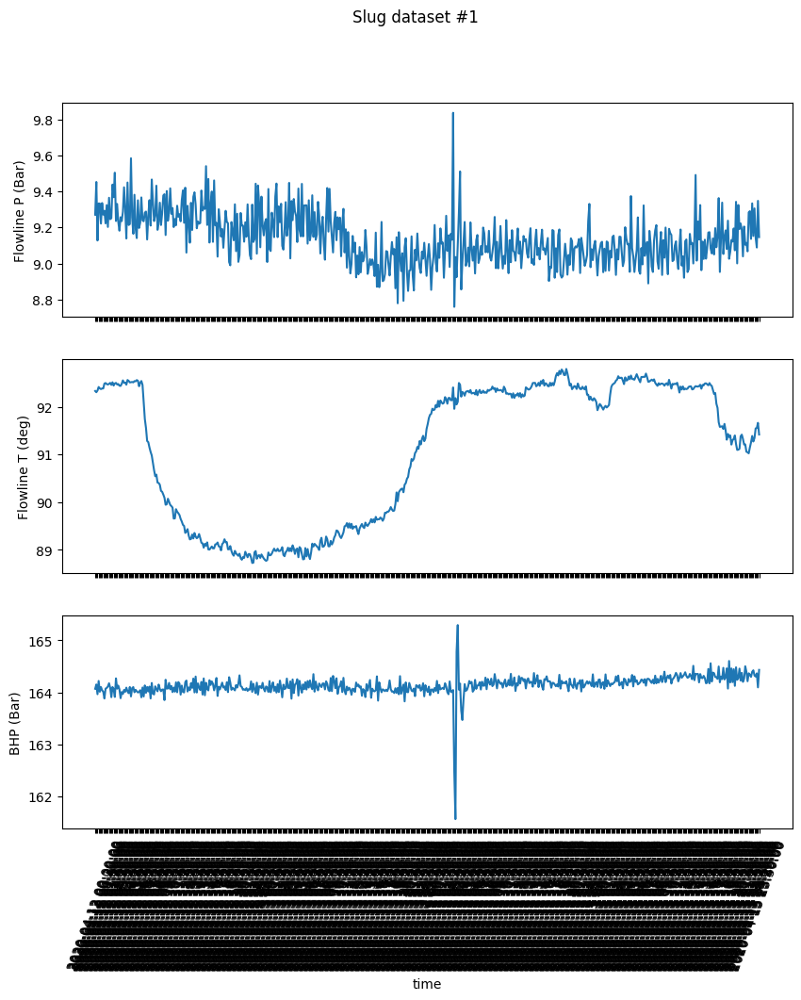

In [101]:
fig, ts = plt.subplots(3,figsize=(10,10),sharex = True)

fig.suptitle('Slug dataset #1')
ts[2].set_xlabel('time')
ts[0].set_ylabel('Flowline P (Bar)')
ts[1].set_ylabel('Flowline T (deg)')
ts[2].set_ylabel('BHP (Bar)')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(reduced_df1[reduced_df1.columns[0]], reduced_df1["Flowline Pressure"])
ts[1].plot(reduced_df1[reduced_df1.columns[0]], reduced_df1["Flowline Temperature"])
ts[2].plot(reduced_df1[reduced_df1.columns[0]], reduced_df1["BHP"])


Is the steady state production in the timeseries a true white noise?
Taking a 'random' steady state interval for analysis.

length of dataset 2160


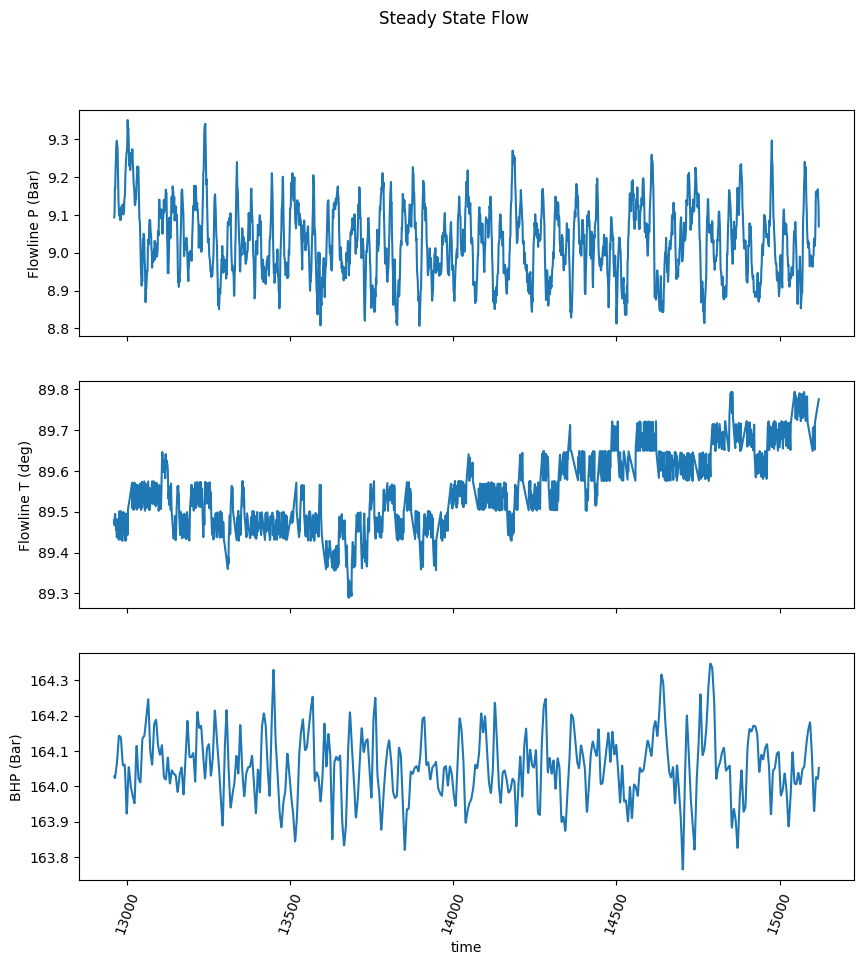

In [102]:
start_date = '2020-04-13 12:00:00'
end_date = '2020-04-13 18:00:00'
mask_ss = (slug_1_df[slug_1_df.columns[0]] > start_date) & (slug_1_df[slug_1_df.columns[0]] <= end_date)

steady_state = slug_1_df.loc[mask_ss]

fig_ss, ts_ss = plt.subplots(3,figsize=(10,10),sharex = True)

fig_ss.suptitle('Steady State Flow')
ts_ss[2].set_xlabel('time')
ts_ss[0].set_ylabel('Flowline P (Bar)')
ts_ss[1].set_ylabel('Flowline T (deg)')
ts_ss[2].set_ylabel('BHP (Bar)')

degrees = 70
plt.xticks(rotation=degrees)

ts_ss[0].plot(steady_state.index, steady_state["Flowline Pressure"])
ts_ss[1].plot(steady_state.index, steady_state["Flowline Temperature"])
ts_ss[2].plot(steady_state.index, steady_state["BHP"])

print('length of dataset', len(steady_state))

freq units: 4.629630E-05 Hz


<AxesSubplot:xlabel='BHP', ylabel='count'>

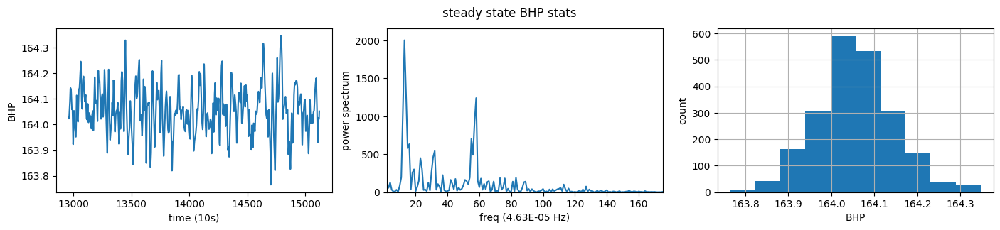

In [103]:
fig_ss_analysis, data = plt.subplots(1, 3, figsize=(17, 3))

freq_units = 0.1/len(steady_state)
print('freq units: %(units)4E Hz' %{"units":(freq_units)})

fig_ss_analysis.suptitle('steady state BHP stats')
data[0].set_xlabel('time (10s)')
data[0].set_ylabel('BHP')
data[1].set_xlabel('freq (%(units).2E Hz)' %{"units":(freq_units)})
data[1].set_ylabel('power spectrum')
data[2].set_xlabel('BHP')
data[2].set_ylabel('count')

data[1].set_xlim(2,175)
data[1].set_ylim(0,2160)

ss_BHP = steady_state['BHP']

fft_ss = np.fft.rfft(ss_BHP)
fft_ss_abs = np.abs(fft_ss)
power_spectrum_ss = np.square(fft_ss_abs)


data[0].plot(ss_BHP)
data[1].plot(power_spectrum_ss)
ss_BHP.hist()


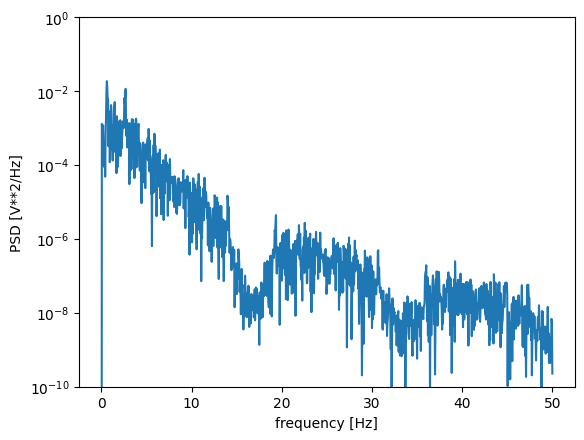

In [104]:
f, Pxx_den = signal.periodogram(ss_BHP, 100)
plt.semilogy(f, Pxx_den)
plt.ylim([1e-10, 1e0])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

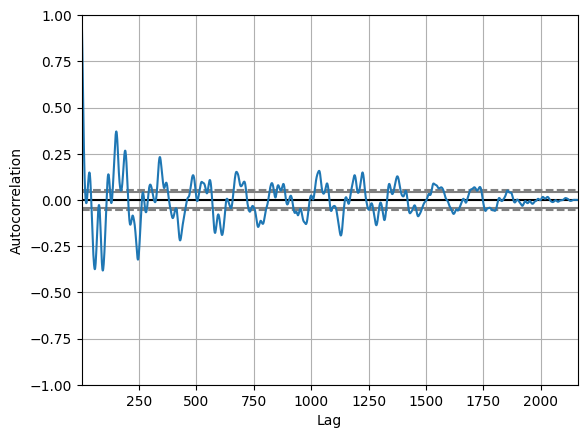

In [105]:
autocorrelation_plot(ss_BHP)

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



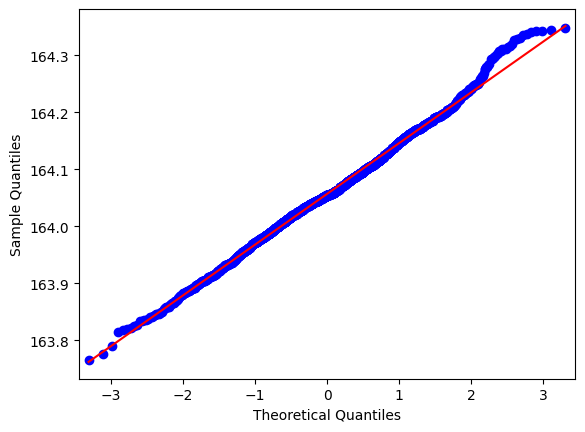

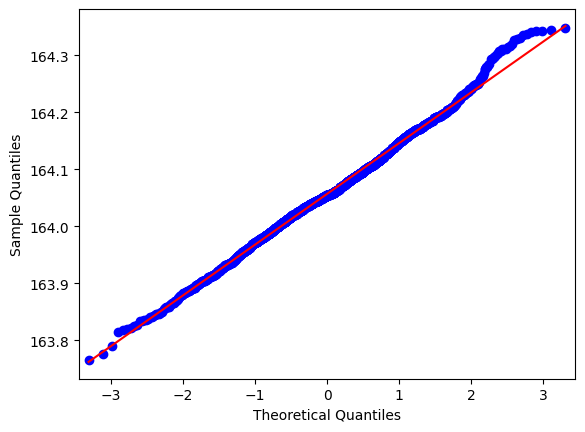

In [106]:
qqplot(ss_BHP, line='s')

In [107]:
# normality test
result = anderson(ss_BHP)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 2.033
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning:

invalid value encountered in sqrt

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning:

invalid value encountered in sqrt



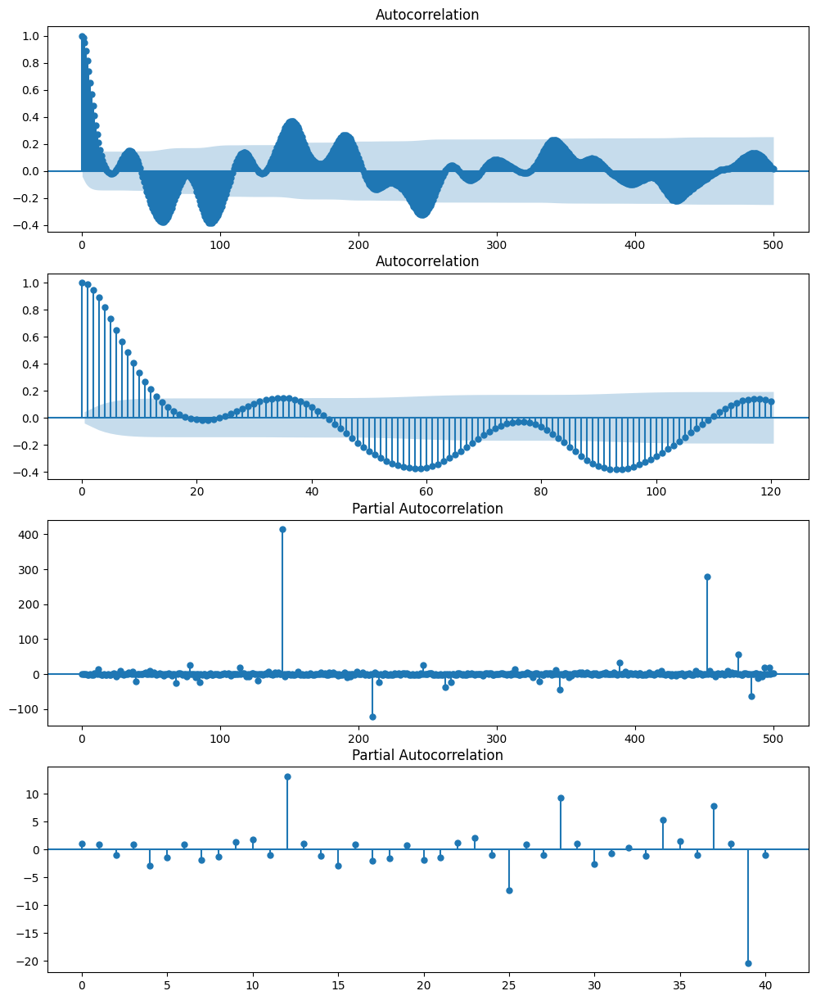

In [108]:
import statsmodels.api as sm

fig = plt.figure(figsize=(12,15))
ax1 = fig.add_subplot(411)
fig = sm.graphics.tsa.plot_acf(ss_BHP.values.squeeze(), lags=500, ax=ax1)
ax2 = fig.add_subplot(412)
fig = sm.graphics.tsa.plot_acf(ss_BHP.values.squeeze(), lags=120, ax=ax2)
ax3 = fig.add_subplot(413)
fig = sm.graphics.tsa.plot_pacf(ss_BHP, lags=500, ax=ax3)
ax4 = fig.add_subplot(414)
fig = sm.graphics.tsa.plot_pacf(ss_BHP, lags=40, ax=ax4)

Well, the BHP data at steady state are not really normally distributed... How does the persisitent homology looks like?

We know when a slugging / irregulaf flow event occurred, so the dataframe is trimmed to a window of a manageable size centered around the event.

In [109]:
#slug_signal = slug_event_1["BHP"]
print('length of signal to analyze', len(ss_BHP))

max_time_delay = 200 
max_embedding_dimension = 10
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    ss_BHP, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_ss_BHP = embedder.fit_transform(ss_BHP)

pca = PCA(n_components=3)
y_ss_BHP_pca = pca.fit_transform(y_ss_BHP)

plot_point_cloud(y_ss_BHP_pca)



length of signal to analyze 2160
Optimal embedding time delay based on mutual information: 20
Optimal embedding dimension based on false nearest neighbors: 6


In [110]:
print('ss_BHP', ss_BHP.size)
ss_BHP_small = ss_BHP.head(1000)
print('ss_BHP_small', ss_BHP_small.size)
print('white_noise_gen', len(white_noise_gen))

# going down to a smaller array to reduce computational cost

ss_BHP 2160
ss_BHP_small 1000
white_noise_gen 1000


Getting a bit more of details about the choice of the optimal time delay for the embedding... 

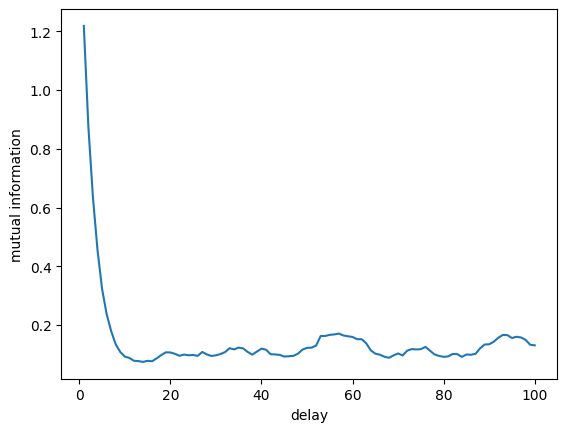

In [111]:
X = ss_BHP_small
max_time_delay = int(len(X)/10)
bins = int(len(X)/100)

mutual_information_list = []

for time_delay in range(1, max_time_delay + 1):
    mutual_information_list.append(mutual_information(X, time_delay, n_bins=bins))
           

plt.plot(range(1,max_time_delay+1),mutual_information_list);
plt.xlabel('delay');
plt.ylabel('mutual information');

In [112]:
max_time_delay = 200 
max_embedding_dimension = 25
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    ss_BHP_small, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_ss_BHP = embedder.fit_transform(ss_BHP_small)

pca = PCA(n_components=3)
y_ss_BHP_pca = pca.fit_transform(y_ss_BHP)

plot_point_cloud(y_ss_BHP_pca)



Optimal embedding time delay based on mutual information: 9
Optimal embedding dimension based on false nearest neighbors: 13


In [113]:
y_ss_BHP_reshaped = y_ss_BHP.reshape(1, *y_ss_BHP.shape)
PH_BHP =  VRP.fit_transform(y_ss_BHP_reshaped)
VRP.plot(PH_BHP)

In [114]:
PE_BHP = PersistenceEntropy()
features = PE_BHP.fit_transform(PH_BHP)
features 

array([[9.76734366, 7.22098785, 6.8255661 ]])

In [115]:
PE_BHP_norm = PersistenceEntropy(normalize=True)
features_norm = PE_BHP_norm.fit_transform(PH_BHP)
features_norm 

array([[ 1.72891166,  2.93378714, 34.06614824]])

In [116]:
Betti_BHP = Betti.fit_transform_plot(PH_BHP)

In [117]:
HK_BHP = HK.fit_transform(PH_BHP)
HK.plot(HK_BHP)

The timeseries has a clear anomaly at the timestamp '2020-04-14 02:40:00', which we know is riser-induces slugging.

In [118]:
start_date = '2020-04-14 03:00:00'
end_date = '2020-04-14 05:30:00'
mask = (slug_1_df[slug_1_df.columns[0]] > start_date) & (slug_1_df[slug_1_df.columns[0]] <= end_date)

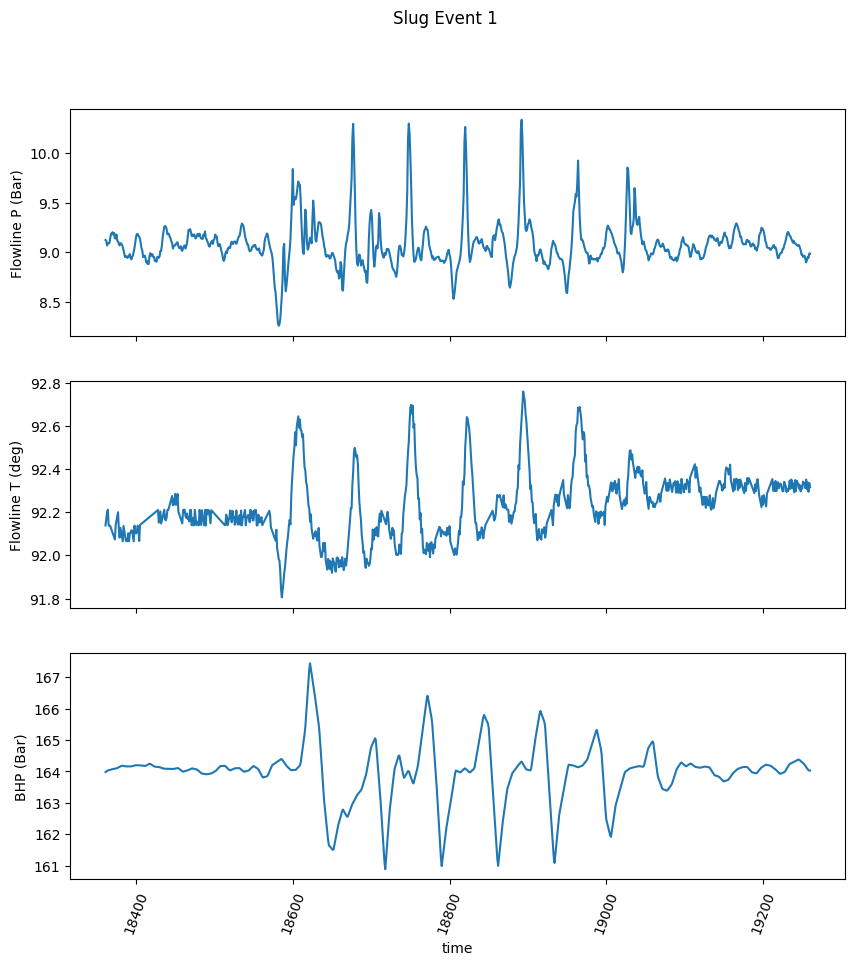

In [119]:
slug_event_1 = slug_1_df.loc[mask]

fig, ts = plt.subplots(3,figsize=(10,10),sharex = True)

fig.suptitle('Slug Event 1')
ts[2].set_xlabel('time')
ts[0].set_ylabel('Flowline P (Bar)')
ts[1].set_ylabel('Flowline T (deg)')
ts[2].set_ylabel('BHP (Bar)')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_event_1.index, slug_event_1["Flowline Pressure"])
ts[1].plot(slug_event_1.index, slug_event_1["Flowline Temperature"])
ts[2].plot(slug_event_1.index, slug_event_1["BHP"])

In [120]:
point_cloud = []

for entry in slug_event_1.index:
    FLW_P = slug_event_1["Flowline Pressure"][entry]
    FLW_T = slug_event_1["Flowline Temperature"][entry]
    BH_P = slug_event_1["BHP"][entry]
    point_cloud.append([FLW_P, FLW_T, BH_P])
        
plot_point_cloud(np.asarray(point_cloud))

The three timeseries show similar features: a series of seven peaks with an apparent period of 70 time intervals
(70 x 10s = 11.7 min). For sake of testing we focus here on BHP and apply a Taken embedding. 

There has been extensive work on understanding the behavior of the underlying dynamical system given only a 
time series [1, 2]. The revolutionary work of Takens [3] extended by Sauer et al. [4] showed that, 
given most choices of parameters, the state-space of the dynamical system can be reconstructed through the 
Takens’embedding. Computationally, this arises
as the following procedure. Given a time series [x1,··· , xn], a
choice of dimension d and time lag τ give rise to a point cloud
$χ = {xi:= (xi, xi+τ ,··· ,(xi+(d−1)τ)} ⊂ R_d. $

Then the goal is
to analyze this point cloud, which really is a sampling of the
full state space, in a way that the dynamics can be understood.

In [121]:
slug_signal = slug_event_1["Flowline Pressure"]
print('length of signal to analyze', len(slug_signal))

max_time_delay = 200 
max_embedding_dimension = 9
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    slug_signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

length of signal to analyze 900
Optimal embedding time delay based on mutual information: 40
Optimal embedding dimension based on false nearest neighbors: 9


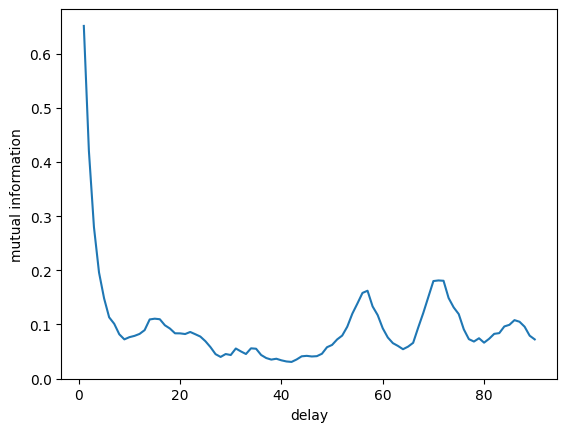

In [122]:
X = slug_signal
max_time_delay = int(len(X)/10)
bins = int(len(X)/100)

mutual_information_list = []

for time_delay in range(1, max_time_delay + 1):
    mutual_information_list.append(mutual_information(X, time_delay, n_bins=bins))
           

plt.plot(range(1,max_time_delay+1),mutual_information_list);
plt.xlabel('delay');
plt.ylabel('mutual information');

In [123]:
embedding_dimension = 9
embedding_time_delay = 40
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_slug_embedded = embedder.fit_transform(slug_signal)

pca = PCA(n_components=3)
y_slug_embedded_pca = pca.fit_transform(y_slug_embedded)

plot_point_cloud(y_slug_embedded_pca)

In [124]:
homology_dimensions = (0, 1, 2)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

#y_slug_embedded.reshape(1, *y_slug_embedded.shape)
# the array need to be reshaped as the library expects many 2D arrays of dimensions n_windows x window_size

y_slug_embedded_reshaped = y_slug_embedded.reshape(1, *y_slug_embedded.shape)
print(f"y_slug_embedded_reshaped.shape",y_slug_embedded_reshaped.shape)
print(f"y_slug_embedded.shape", y_slug_embedded.shape)


X_diagrams = VRP.fit_transform(y_slug_embedded_reshaped)
VRP.plot(X_diagrams)

y_slug_embedded_reshaped.shape (1, 580, 9)
y_slug_embedded.shape (580, 9)


In [125]:
slug_signal = slug_event_1["BHP"]
print('length of signal to analyze', len(slug_signal))

max_time_delay = 200 
max_embedding_dimension = 20
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    slug_signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

length of signal to analyze 900
Optimal embedding time delay based on mutual information: 42
Optimal embedding dimension based on false nearest neighbors: 8


In [126]:
embedding_dimension = 8
embedding_time_delay = 42
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_slug_embedded = embedder.fit_transform(slug_signal)

pca = PCA(n_components=3)
y_slug_embedded_pca = pca.fit_transform(y_slug_embedded)

plot_point_cloud(y_slug_embedded_pca)

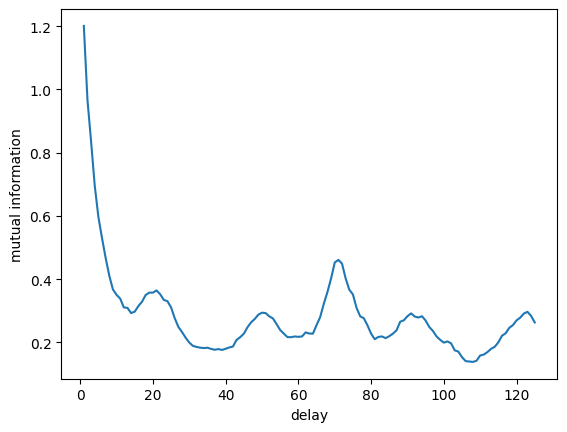

In [127]:
max_time_delay = 125

X = slug_signal
mutual_information_list = []

for time_delay in range(1, max_time_delay + 1):
    mutual_information_list.append(mutual_information(X, time_delay, n_bins=12))
           
plt.plot(range(1,max_time_delay+1),mutual_information_list);
plt.xlabel('delay');
plt.ylabel('mutual information');

In [128]:
homology_dimensions = (0, 1, 2)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

y_slug_embedded_reshaped = y_slug_embedded.reshape(1, *y_slug_embedded.shape)
print(f"y_slug_embedded_reshaped.shape",y_slug_embedded_reshaped.shape)
print(f"y_slug_embedded.shape", y_slug_embedded.shape)

X_diagrams = VRP.fit_transform(y_slug_embedded_reshaped)
VRP.plot(X_diagrams)

y_slug_embedded_reshaped.shape (1, 606, 8)
y_slug_embedded.shape (606, 8)


In [129]:
PE_slug = PersistenceEntropy()
features = PE_slug.fit_transform(X_diagrams)
features

array([[9.15600024, 6.04216421, 2.3911698 ]])

In [130]:
PE_slug_norm = PersistenceEntropy(normalize=True)
features_norm = PE_slug_norm.fit_transform(X_diagrams)
features_norm

array([[ 1.15065968,  1.24135136, -7.6741212 ]])

The entropy for H$_0$ is just barely lower than that for white noise, but the one for H$_1$ is much lower (6.0 vs 7.4). This clearly shows that there is some signal in the timeseries representing normal operation.

Let's start establishing a series of sliding windows along the slugging timeseries for the BHP for which 
we compute the persistent entropy. This is to test the ability of the persistent entropy as an indicator
for anomaly detection.

In [141]:
slug_signal_200 = slug_signal[1300:1500]

fig = px.line()
#for dim in range(X_persistence_entropy.shape[1]):
fig.add_scatter(y=slug_signal_200, name="signal")
fig.show()

In [161]:
max_time_delay = 20 
max_embedding_dimension = 12
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    slug_signal_200, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")
embedding_dimension = optimal_time_delay
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_slug_embedded = embedder.fit_transform(slug_signal_200)

pca = PCA(n_components=3)
y_slug_embedded_pca = pca.fit_transform(y_slug_embedded)

plot_point_cloud(y_slug_embedded_pca)

Optimal embedding time delay based on mutual information: 11
Optimal embedding dimension based on false nearest neighbors: 7


In [162]:
X_diagrams = VRP.fit_transform(y_slug_embedded_reshaped)
VRP.plot(X_diagrams)

In [163]:
features_norm = PE_slug_norm.fit_transform(X_diagrams)
features = PE_slug.fit_transform(X_diagrams)
features

array([[9.15600024, 6.04216421, 2.3911698 ]])

In [145]:
start_date = '2020-04-14 00:30:00'
end_date = '2020-04-14 08:00:00'
mask = (slug_1_df[slug_1_df.columns[0]] > start_date) & (slug_1_df[slug_1_df.columns[0]] <= end_date)

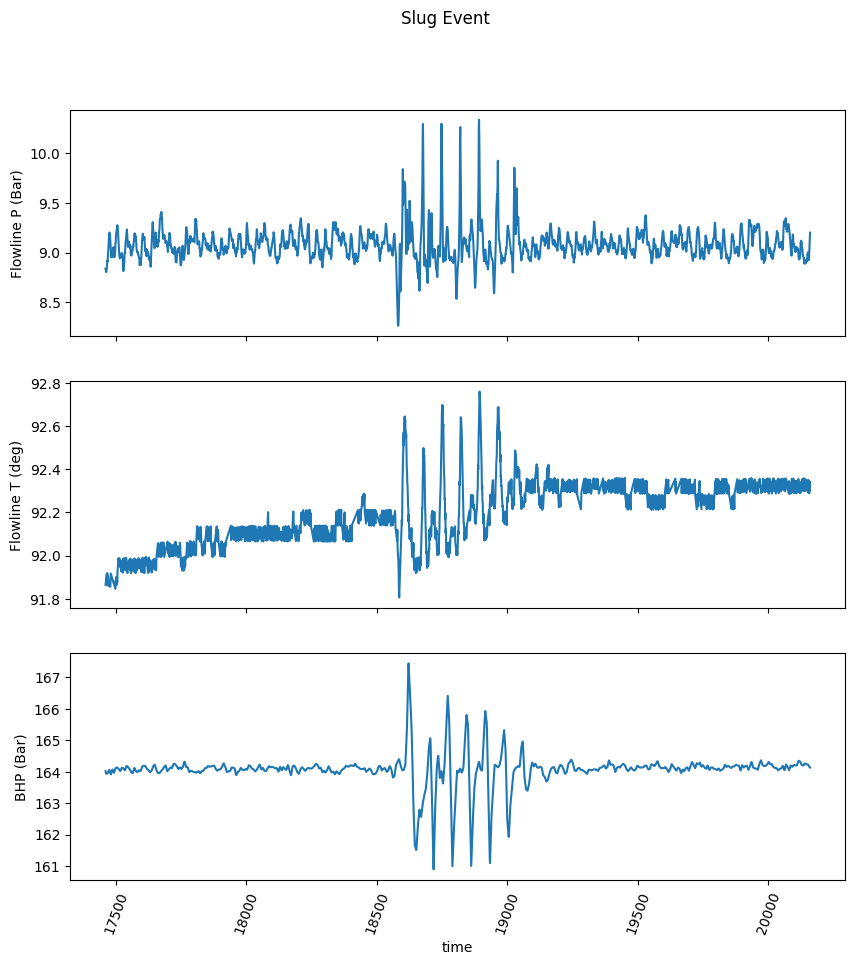

In [146]:
slug_event_large = slug_1_df.loc[mask]

fig, ts = plt.subplots(3,figsize=(10,10),sharex = True)

fig.suptitle('Slug Event')
ts[2].set_xlabel('time')
ts[0].set_ylabel('Flowline P (Bar)')
ts[1].set_ylabel('Flowline T (deg)')
ts[2].set_ylabel('BHP (Bar)')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_event_large.index, slug_event_large["Flowline Pressure"])
ts[1].plot(slug_event_large.index, slug_event_large["Flowline Temperature"])
ts[2].plot(slug_event_large.index, slug_event_large["BHP"])

The periodicity of the slugging event is of about 75 timesteps, so we start with a sliding window of 150. 
Note that this is not too far from the periodicity of the signal in normal operations, therefore this can give rise to a lot of noise. 

In [256]:
slug_signal = slug_event_large["BHP"]

window_size = 250
window_stride = 50
SW = SlidingWindow(size=window_size, stride=window_stride)

X_windows = SW.fit_transform(slug_signal)

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

TE = TakensEmbedding(time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride)
X_embedded_BHP200 = TE.fit_transform(X_windows)

Optimal embedding time delay based on mutual information: 5
Optimal embedding dimension based on false nearest neighbors: 6


In [257]:
X_embedded_BHP200.shape

(50, 225, 6)

In [260]:
pca = PCA(n_components=3)
homology_dimensions = (0, 1)
persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
entropy = PersistenceEntropy(normalize=True)

steps = [
         ("pca", batch_pca),
         ("persistence", persistence),
         ("entropy", entropy)
        ]
topological_transfomer = Pipeline(steps)

In [261]:
X_persistence_entropy = topological_transfomer.fit_transform(X_embedded_BHP200)

fig = px.line(title='E_norm for BHP, indexed by sliding window number, window of 200 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [262]:
pca = PCA(n_components=3)
homology_dimensions = (0, 1)
persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
entropy = PersistenceEntropy()

steps = [
         ("pca", batch_pca),
         ("persistence", persistence),
         ("entropy", entropy)
        ]
topological_transfomer_notNorm = Pipeline(steps)

In [263]:
X_persistence_entropy = topological_transfomer_notNorm.fit_transform(X_embedded_BHP200)

fig = px.line(title='E for BHP, indexed by sliding window number, window of 200 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [267]:
p_W = 2
PD = PairwiseDistance(metric='wasserstein',
                      metric_params={'p': p_W, 'delta': 0.1},
                      order=None)

X_diagrams_BHP200 = persistence.fit_transform(X_embedded_BHP200)
X200_distance_W = PD.fit_transform(X_diagrams_BHP200)
plot_heatmap(X200_distance_W[:, :, 0], colorscale='blues')

In [208]:
slug_signal = slug_event_large["BHP"]

window_size = 250
window_stride = 5
SW = SlidingWindow(size=window_size, stride=window_stride)
X_windows = SW.fit_transform(slug_signal)

max_time_delay = 12
max_embedding_dimension = 14
stride = 1

homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
pca = PCA(n_components=3)
PE_slug = PersistenceEntropy()
PE_norm = PersistenceEntropy(normalize=True)

entropies = []
norm_entropies = []
parameters = []
diagrams = []
point_clouds = []
point_clouds_pca = []

for win in range(X_windows.shape[0]):
    optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
        X_windows[win], max_time_delay, max_embedding_dimension, stride=stride
        )
    if optimal_embedding_dimension < 3:
        optimal_embedding_dimension = 3

    parameters.append(np.column_stack((win, optimal_embedding_dimension, optimal_time_delay)))
    
    embedder = SingleTakensEmbedding(
        parameters_type="fixed", n_jobs=6, time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride
        )

    y_slug_embedded = embedder.fit_transform(X_windows[win])
    y_slug_embedded_reshaped = y_slug_embedded.reshape(1, *y_slug_embedded.shape)

    y_slug_embedded_pca = pca.fit_transform(y_slug_embedded)

    X_diagram = VRP.fit_transform(y_slug_embedded_reshaped)
    features = PE_slug.fit_transform(X_diagram)
    features_norm = PE_norm.fit_transform(X_diagram)

    point_clouds_pca.append(y_slug_embedded_pca)
    point_clouds.append(y_slug_embedded)
    entropies.append(features)
    norm_entropies.append(features_norm)
    diagrams.append(X_diagram)

In [210]:
entropy_H0 = []
entropy_H1 = []
norm_entropy_H0 = []
norm_entropy_H1 = []

for i in entropies[:]:
    entropy_H0.append(i[0][0])
    entropy_H1.append(i[0][1])
    
for i in norm_entropies[:]:
    norm_entropy_H0.append(i[0][0])
    norm_entropy_H1.append(i[0][1])


In [211]:
fig = px.line(title='E_pers for BHP, indexed by sliding window number, window of 250 timesteps')
fig.add_scatter(y=entropy_H0, name="PE in homology dimension H_0")
fig.add_scatter(y=entropy_H1, name="PE in homology dimension H_1")
fig.show()

In [212]:
fig = px.line(title='E_norm for BHP, indexed by sliding window number, window of 250 timesteps')
fig.add_scatter(y=norm_entropy_H0, name="PE in homology dimension H_0")
fig.add_scatter(y=norm_entropy_H1, name="PE in homology dimension H_1")
fig.show()

In [275]:
slug_signal = slug_event_large["BHP"]

window_size = 800
window_stride = 20
SW = SlidingWindow(size=window_size, stride=window_stride)

X_windows = SW.fit_transform(slug_signal)

TE = TakensEmbedding(time_delay=42, dimension=8, stride=stride)
X_embedded_BHP800 = TE.fit_transform(X_windows)

In [276]:
X_windows.shape

(96, 800)

In [277]:
X_diagrams_BHP800 = VRP.fit_transform(X_embedded_BHP800)

In [388]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in X_diagrams_BHP800: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))
    pers_H0 = []
    pers_H1 = []
           
fig = px.line(title='Maximum Persistence for BHP, indexed by sliding window number, window of 800 timesteps')
fig.add_scatter(y=max_pers_H0, name="Max Pers in homology dimension H_0")
fig.add_scatter(y=max_pers_H1, name="Max Pers in homology dimension H_1")
fig.show() 

In [278]:
PE = PersistenceEntropy()
X_persistence_entropy = PE.fit_transform(X_diagrams_BHP800)

fig = px.line(title='E_pers for BHP, indexed by sliding window number, window of 900 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [279]:
PE_norm = PersistenceEntropy(normalize=True)
X_persistence_entropy_norm = PE_norm.fit_transform(X_diagrams_BHP800)

fig = px.line(title='nomalized E_pers for BHP, indexed by sliding window number, window of 800 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy_norm[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [298]:
Betti_BHP800 = Betti.fit_transform(X_diagrams_BHP800)
Betti_BHP800.shape

(96, 2, 100)

In [331]:
figBetti = px.line()

for i in range(50):
    figBetti.add_scatter(y=(Betti_BHP800[i, 0, :]+5*i))
figBetti.show()


In [335]:
figBetti = px.line()

for i in range(50,len((Betti_BHP800[:,0,0]))):
    figBetti.add_scatter(y=(Betti_BHP800[i, 0, :]-5*i))
figBetti.show()


In [356]:
meanBettiH0 = []
medianBettiH0 = []
modeBettiH0 = []

for i in range(len(Betti_BHP800[:,0,0])):
    meanBettiH0.append(stats.mean(Betti_BHP800[i,0,:]))
    medianBettiH0.append(stats.median(Betti_BHP800[i,0,:]))
    modeBettiH0.append(stats.mode(Betti_BHP800[i,0,:]))
    
    
figBetti = px.line()
figBetti.add_scatter(y=(meanBettiH0), name="Mean of Betti curve H_0")
figBetti.add_scatter(y=(medianBettiH0), name="Median of Betti curve H_0")
figBetti.add_scatter(y=(modeBettiH0),name="Mode of Betti curve H_0")
figBetti.show()


In [350]:
figBetti = px.line(color_discrete_sequence=['gray', 'blue'])

for i in range(len(Betti_BHP800[:,0,0])):
#for i in range(50):
    figBetti.add_scatter(y=(Betti_BHP800[i, 1, :]+5*i))
figBetti.show()


In [358]:
meanBettiH1 = []
medianBettiH1 = []
modeBettiH1 = []

Betti_BHP800[i, 1, :]
for i in range(len(Betti_BHP800[:,1,0])):
    meanBettiH1.append(stats.mean(Betti_BHP800[i,1,:]))
    medianBettiH1.append(stats.median(Betti_BHP800[i,1,:]))
    modeBettiH1.append(stats.mode(Betti_BHP800[i,1,:]))
    
    
figBetti = px.line()
figBetti.add_scatter(y=(meanBettiH1), name="Mean of Betti curve H_1")
figBetti.add_scatter(y=(medianBettiH1), name="Median of Betti curve H_1")
figBetti.add_scatter(y=(modeBettiH1),name="Mode of Betti curve H_1")
figBetti.show()


In [280]:
p_W = 2
PD = PairwiseDistance(metric='wasserstein',
                      metric_params={'p': p_W, 'delta': 0.1},
                      order=None)

X800_distance_W = PD.fit_transform(X_diagrams_BHP800)

In [281]:
plot_heatmap(X800_distance_W[:, :, 0], colorscale='blues')

In [282]:
plot_heatmap(X800_distance_W[:, :, 1], colorscale='blues')

In [283]:
fig1 = px.line()
fig1.add_scatter(y=X800_distance_W[:, 1, 0])
fig1.show()

In [284]:
fig1 = px.line()
fig1.add_scatter(y=X800_distance_W[:, 1, 1])
fig1.show()

In [285]:
p_L = 2
n_layers = 5
PD_L = PairwiseDistance(metric='landscape',
                      metric_params={'p': p_L, 'n_layers': n_layers, 'n_bins': 1000},
                      order=None)

X800_distance_L = PD_L.fit_transform(X_diagrams_BHP800)
plot_heatmap(X800_distance_L[:, :, 0], colorscale='reds')

In [286]:
plot_heatmap(X800_distance_L[:, :, 1], colorscale='reds')

In [290]:
PD_L = PairwiseDistance(metric='bottleneck')

X800_distance_L = PD_L.fit_transform(X_diagrams_BHP800)

In [292]:
plot_heatmap(X800_distance_L, colorscale='greys')

In [244]:
window_number = 47
TE.plot(X_embedded_BHP900, sample=window_number)

In [360]:
VRP.plot(X_diagrams_BHP900, sample=47)

In [246]:
window_number = 10
TE.plot(X_embedded_BHP900, sample=window_number)

In [247]:
VRP.plot(X_diagrams_BHP900, sample=10)

In [84]:
PE_norm = PersistenceEntropy(normalize=True)
X_persistence_entropy_norm = PE_norm.fit_transform(X_diagrams_BHP900)

fig = px.line(title='nomalized E_pers for BHP, indexed by sliding window number, window of 900 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy_norm[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [85]:
PE_norm = PersistenceEntropy(normalize=True)
X_persistence_entropy_norm = PE_norm.fit_transform(X_diagrams_BHP900)

fig = px.line(title='nomalized E_pers for BHP, indexed by sliding window number, window of 900 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    if dim==2: 
        continue
    fig.add_scatter(y=X_persistence_entropy_norm[:, dim], name=f"PE in homology dimension {dim}")
    
fig.show()

In [219]:
window_number = 100
TE.plot(X_embedded_BHP900, sample=window_number)

IndexError: index 100 is out of bounds for axis 0 with size 96

Testing the same approach but with a smaller time window, hoping to obtain a higher resolution.

In [87]:
slug_signal = slug_event_large["BHP"]

window_size = 450
window_stride = 10
SW = SlidingWindow(size=window_size, stride=window_stride)

X_windows = SW.fit_transform(slug_signal)
optimal_time_delay = 42
optimal_embedding_dimension = 8
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")
print(f"lenght of signal: {len(slug_signal)}")

TE = TakensEmbedding(time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride)
X_embedded_BHP450 = TE.fit_transform(X_windows)

Optimal embedding time delay based on mutual information: 42
Optimal embedding dimension based on false nearest neighbors: 8
lenght of signal: 2700


In [88]:
X_windows.shape

(226, 450)

In [89]:
len(X_windows[0])

450

Compute the persistent entropies for a sliding window approach with window_size = 450, where each window is 
processed at its optimal parameters.

In [90]:
max_time_delay = 25
max_embedding_dimension = 15
stride = 1

homology_dimensions = (0, 1, 2)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
pca = PCA(n_components=3)
PE_slug = PersistenceEntropy()
PE_norm = PersistenceEntropy(normalize=True)

entropies = []
norm_entropies = []
parameters = []
diagrams = []
point_clouds = []
point_clouds_pca = []

for win in range(X_windows.shape[0]):
    optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
        X_windows[win], max_time_delay, max_embedding_dimension, stride=stride
        )

    parameters.append(np.column_stack((win, optimal_embedding_dimension, optimal_time_delay)))
    
    embedder = SingleTakensEmbedding(
        parameters_type="search", n_jobs=6, time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride
        )

    y_slug_embedded = embedder.fit_transform(X_windows[win])
    y_slug_embedded_reshaped = y_slug_embedded.reshape(1, *y_slug_embedded.shape)

    y_slug_embedded_pca = pca.fit_transform(y_slug_embedded)

    X_diagram = VRP.fit_transform(y_slug_embedded_reshaped)
    features = PE_slug.fit_transform(X_diagram)
    features_norm = PE_norm.fit_transform(X_diagram)

    point_clouds_pca.append(y_slug_embedded_pca)
    point_clouds.append(y_slug_embedded)
    entropies.append(features)
    norm_entropies.append(features_norm)
    diagrams.append(X_diagram)

In [91]:
entropy_H0 = []
entropy_H1 = []
entropy_H2 = []
norm_entropy_H0 = []
norm_entropy_H1 = []
norm_entropy_H2 = []

for i in entropies[:]:
    entropy_H0.append(i[0][0])
    entropy_H1.append(i[0][1])
    entropy_H2.append(i[0][2])
    
for i in norm_entropies[:]:
    norm_entropy_H0.append(i[0][0])
    norm_entropy_H1.append(i[0][1])
    norm_entropy_H2.append(i[0][2])

In [92]:
fig = px.line(title='E_pers for BHP, indexed by sliding window number, window of 450 timesteps')
fig.add_scatter(y=entropy_H0, name=f"PE in homology dimension 0")
fig.add_scatter(y=entropy_H1, name=f"PE in homology dimension 1")
fig.add_scatter(y=entropy_H2, name=f"PE in homology dimension 2")
fig.show()

In [93]:
fig = px.line(title='nomalized E_pers for BHP, indexed by sliding window number, window of 450 timesteps')
fig.add_scatter(y=norm_entropy_H0, name=f"PE in homology dimension 0")
fig.add_scatter(y=norm_entropy_H1, name=f"PE in homology dimension 1")
fig.add_scatter(y=norm_entropy_H2, name=f"PE in homology dimension 2")
layout_yaxis_range=[-10,49]
fig.show()

In [94]:
plot_point_cloud(point_clouds_pca[101])

In [95]:
VRP.plot(diagrams[101])

In [96]:
plot_point_cloud(point_clouds_pca[56])

In [97]:
VRP.plot(diagrams[56])

In [98]:
plot_point_cloud(point_clouds_pca[121])

In [99]:
VRP.plot(diagrams[121])

In [100]:
PE_norm = PersistenceEntropy(normalize=True)
PE = PersistenceEntropy()
features_norm = PE_norm.fit_transform(diagrams[121])
features = PE.fit_transform(diagrams[121]) 
print('Entropy Normalized', features_norm)
print('Entropy', features)

Entropy Normalized [[ 1.13132909  1.51512817 -1.        ]]
Entropy [[ 8.23720115  6.63752358 -1.        ]]


In [101]:
parameters[121]

array([[121,   9,  17]])

In [102]:
Betti.fit_transform_plot(diagrams[121])

array([[[313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 313,
         313, 313, 313, 313, 313, 313, 313, 313, 313, 313, 309, 309,
         309, 307, 307, 307, 306, 302, 298, 296, 296, 296, 294, 293,
         293, 291, 289, 287, 287, 283, 275, 271, 269, 267, 260, 256,
         256, 254, 252, 250, 249, 248, 246, 245, 238, 228, 226, 219,
         217, 215, 210, 205, 198, 190, 175, 167, 162, 154, 140, 129,
         122, 119, 115, 110,  99,  93,  88,  82,  72,  62,  55,  44,
          36,  31,  28,  25,  18,  14,  11,   9,   8,   7,   7,   4,
           3,   1,   1,   0],
        [  1,   1,   1,   0,   0,   2,   2,   5,   2,   8,  10,  12,
          14,  27,  36,  43,  41,  45,  44,  42,  38,  35,  38,  31,
          31,  25,  25,  34,  33,  26,  24,  27,  20,  17,  14,  12,
           8,   8,   8,   6,   6,   7,   7,   7,   6,   8,  12,   7,
           3,   2,   3,   3,   2,   3,   4,   3,   2,   2,   1,   4,
           6,   7,   3,   1,   1,   1,   1,   1,   1,   1,   1,   1,
    

In [103]:
X_diagrams_BHP450 = VRP.fit_transform(X_embedded_BHP450)

In [104]:
PE = PersistenceEntropy()
X_persistence_entropy = PE.fit_transform(X_diagrams_BHP450)

fig = px.line(title='Persistence entropies, indexed by sliding window number')
for dim in range(X_persistence_entropy.shape[1]):
    fig.add_scatter(y=X_persistence_entropy[:, dim], name=f"PE in homology dimension {dim}")
fig.show()

In [105]:
PE_norm = PersistenceEntropy(normalize=True)
X_persistence_entropy_norm = PE_norm.fit_transform(X_diagrams_BHP450)

fig = px.line(title='nomalized E_pers for BHP, indexed by sliding window number, window of 450 timesteps')
for dim in range(X_persistence_entropy.shape[1]):
    if dim==2: 
        continue
    fig.add_scatter(y=X_persistence_entropy_norm[:, dim], name=f"PE in homology dimension {dim}")
    
fig.show()

In [106]:
window_number = 77
TE.plot(X_embedded_BHP450, sample=window_number)

In [117]:
TE.plot(X_embedded_BHP450, sample=126)

In [107]:
SLH = Silhouette()
data_SLH = SLH.fit_transform_plot(X_diagrams_BHP450)

In [183]:
dgms_steady = ripser(y_ss_BHP, maxdim=2)['dgms']
dgms_slug = ripser(y_slug_embedded, maxdim=2)['dgms']

Text(0.5, 1.0, 'Slug $H_1$')

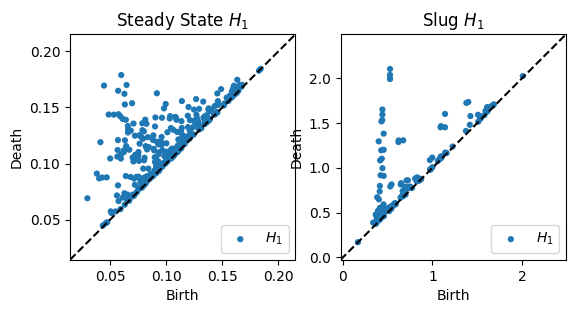

In [184]:
plot_diagrams(dgms_steady, plot_only=[1], ax=plt.subplot(121))
plt.title("Steady State $H_1$")

plot_diagrams(dgms_slug, plot_only=[1], ax=plt.subplot(122))
plt.title("Slug $H_1$")

Text(0.5, 1.0, 'Slug $H_1$')

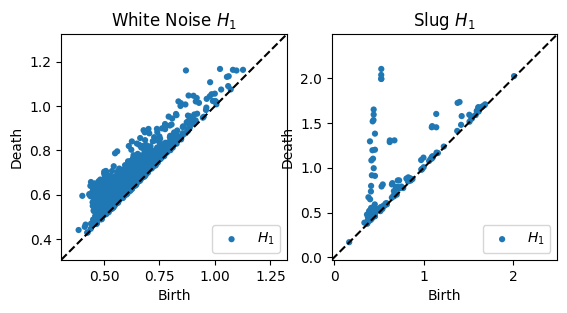

In [185]:
plot_diagrams(dgms, plot_only=[1], ax=plt.subplot(121))
plt.title("White Noise $H_1$")
plot_diagrams(dgms_slug, plot_only=[1], ax=plt.subplot(122))
plt.title("Slug $H_1$")

bottleneck distance steady state vs slugging 0.7884823083877563


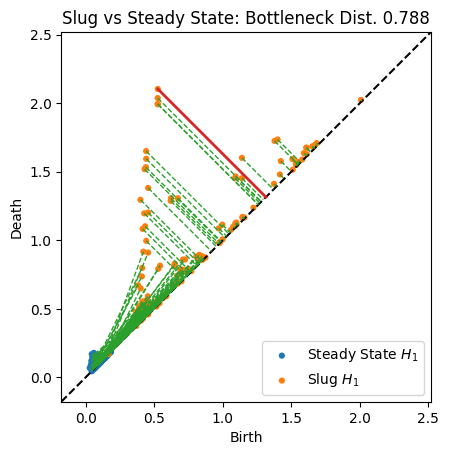

In [186]:
from persim import bottleneck, bottleneck_matching, wasserstein, wasserstein_matching

#Bottleneck distance for H1 of steady state vs slugging 
d_bottle, b_matching = bottleneck(dgms_steady[1], dgms_slug[1], matching=True)
print('bottleneck distance steady state vs slugging', d_bottle)

bottleneck_matching(dgms_steady[1], dgms_slug[1], b_matching, labels=['Steady State $H_1$', 'Slug $H_1$'])
plt.title("Slug vs Steady State: Bottleneck Dist. {:.3f}".format(d_bottle))
plt.show()

wasserstein distance steady state vs slugging 24.429991811989606


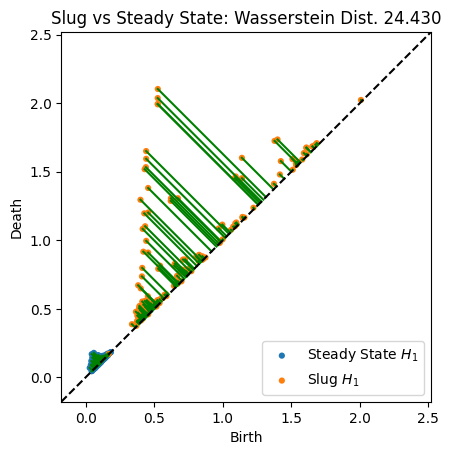

In [187]:
d_wasserstein, w_matching = wasserstein(dgms_steady[1], dgms_slug[1], matching=True)
print('wasserstein distance steady state vs slugging', d_wasserstein)
wasserstein_matching(dgms_steady[1], dgms_slug[1], w_matching, labels=['Steady State $H_1$', 'Slug $H_1$'])
plt.title("Slug vs Steady State: Wasserstein Dist. {:.3f}".format(d_wasserstein))
plt.show()

bottleneck distance white noise vs slugging 0.7884823083877563


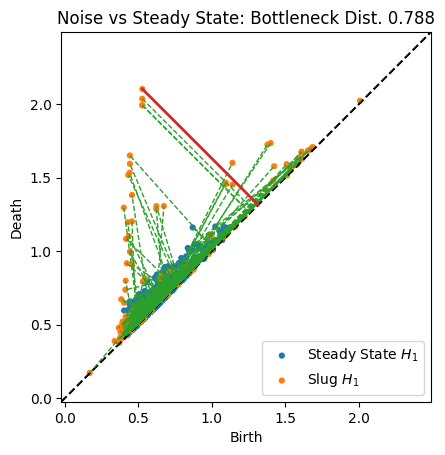

In [188]:
#Bottleneck distance for H1 of white noise vs slugging
d_bottle = bottleneck(dgms[1], dgms_slug[1], matching=False)

d_bottle, b_matching = bottleneck(dgms[1], dgms_slug[1], matching=True)
print('bottleneck distance white noise vs slugging', d_bottle)

bottleneck_matching(dgms[1], dgms_slug[1], b_matching, labels=['Steady State $H_1$', 'Slug $H_1$'])
plt.title("Noise vs Steady State: Bottleneck Dist. {:.3f}".format(d_bottle))
plt.show()

wasserstein distance white noise state vs slugging 52.860367507225476


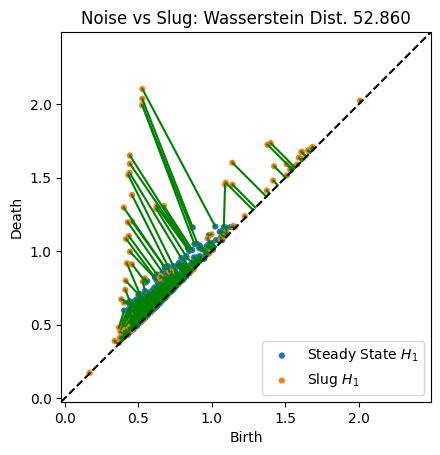

In [189]:
d_wasserstein, w_matching = wasserstein(dgms[1], dgms_slug[1], matching=True)
print('wasserstein distance white noise state vs slugging', d_wasserstein)
wasserstein_matching(dgms[1], dgms_slug[1], w_matching, labels=['Steady State $H_1$', 'Slug $H_1$'])
plt.title("Noise vs Slug: Wasserstein Dist. {:.3f}".format(d_wasserstein))
plt.show()

In [190]:
#test 'self' distance (zero by definition)
d_bottle = bottleneck(dgms_slug[1], dgms_slug[1], matching=False)
d_wasserstein = wasserstein(dgms_slug[1], dgms_slug[1], matching=False)
print('bottleneck distance white noise vs slugging', d_bottle)
print('wasserstein distance white noise state vs slugging', d_wasserstein)

bottleneck distance white noise vs slugging 0.0
wasserstein distance white noise state vs slugging 0.0


In [191]:
X_diagrams 

array([[[0.        , 0.05736724, 0.        ],
        [0.        , 0.05871967, 0.        ],
        [0.        , 0.06055576, 0.        ],
        ...,
        [1.32914555, 1.33369863, 2.        ],
        [1.30462682, 1.30591881, 2.        ],
        [0.83077973, 0.8368417 , 2.        ]]])

In [192]:
dgms[1]

array([[1.12655997, 1.16331208],
       [1.09701037, 1.16024971],
       [1.08113158, 1.16334486],
       ...,
       [0.41332838, 0.4556511 ],
       [0.40236029, 0.59540516],
       [0.38564891, 0.4414092 ]])

In [193]:
HK_slug = HK.fit_transform_plot(X_diagrams, homology_dimension_idx=1)
HK_steady = HK.fit_transform_plot(PH_BHP, homology_dimension_idx=1)
HK_wn = HK.fit_transform_plot(PerHom_wn, homology_dimension_idx = 1)

In [194]:
PI_wn = PI.fit_transform_plot(PerHom_wn, homology_dimension_idx=1)
PI_steady = PI.fit_transform_plot(PH_BHP, homology_dimension_idx=1)
PI_slug = PI.fit_transform_plot(X_diagrams, homology_dimension_idx=1)

In [195]:
from gtda.diagrams import BettiCurve 

Betti = BettiCurve()
Betti_wn = Betti.fit_transform_plot(PerHom_wn)
#Betti_slug = Betti.fit_transform_plot(X_diagrams)

In [196]:
print('slug PH shape',X_diagrams.shape, 'white noise PH shape', PerHom_wn.shape) 
PerHom_wn_shrink = np.reshape(PerHom_wn, (1,807,3))
Diagrams = np.append(X_diagrams,PerHom_wn_shrink,axis=0)
Diagrams.shape

slug PH shape (1, 807, 3) white noise PH shape (1, 2703, 3)


ValueError: cannot reshape array of size 8109 into shape (1,807,3)

In [323]:
from gtda.diagrams import PairwiseDistance
metrics = ['bottleneck', 'wasserstein', 'betti', 'landscape', 'silhouette', 'heat', 'image']

for metric in metrics:
    tmp = PairwiseDistance(metric=metric)
    print(metric, tmp)

bottleneck PairwiseDistance(metric='bottleneck')
wasserstein PairwiseDistance(metric='wasserstein')
betti PairwiseDistance(metric='betti')
landscape PairwiseDistance()
silhouette PairwiseDistance(metric='silhouette')
heat PairwiseDistance(metric='heat')
image PairwiseDistance(metric='image')


In [324]:
print(type(X_diagrams), X_diagrams.shape)
X_diagrams

<class 'numpy.ndarray'> (1, 807, 3)


array([[[0.        , 0.05736724, 0.        ],
        [0.        , 0.05871967, 0.        ],
        [0.        , 0.06055576, 0.        ],
        ...,
        [1.32914555, 1.33369863, 2.        ],
        [1.30462682, 1.30591881, 2.        ],
        [0.83077973, 0.8368417 , 2.        ]]])

In [325]:
print(type(dgms[1]), dgms[1].shape)
dgms[1]

<class 'numpy.ndarray'> (1013, 2)


array([[1.12655997, 1.16331208],
       [1.09701037, 1.16024971],
       [1.08113158, 1.16334486],
       ...,
       [0.41332838, 0.4556511 ],
       [0.40236029, 0.59540516],
       [0.38564891, 0.4414092 ]])

In [326]:
X_diagrams_H1 = X_diagrams[:,:,1]
X_diagrams.shape
#X_diagrams


(1, 807, 3)

In [327]:
X_diagrams[0,700:807,:]

array([[0.54323566, 0.81472325, 1.        ],
       [0.5405553 , 0.56861496, 1.        ],
       [0.53952479, 0.54209316, 1.        ],
       [0.52967823, 0.79188192, 1.        ],
       [0.526833  , 1.99151754, 1.        ],
       [0.52661276, 2.10357738, 1.        ],
       [0.52574611, 2.03729272, 1.        ],
       [0.52551496, 1.99455059, 1.        ],
       [0.5237022 , 0.56296271, 1.        ],
       [0.52111417, 0.55551237, 1.        ],
       [0.51657045, 0.51687425, 1.        ],
       [0.50907266, 0.52643329, 1.        ],
       [0.50671291, 0.54646683, 1.        ],
       [0.50447297, 0.53457552, 1.        ],
       [0.50150871, 0.53381175, 1.        ],
       [0.50147879, 0.54237628, 1.        ],
       [0.4971911 , 0.53321666, 1.        ],
       [0.47621319, 0.53837067, 1.        ],
       [0.46668619, 0.51007551, 1.        ],
       [0.46035963, 0.5067662 , 1.        ],
       [0.45604277, 0.9103049 , 1.        ],
       [0.45602411, 1.38161862, 1.        ],
       [0.

In [328]:
#X_diagrams_H1 = np.zeros(shape=(1,3))
X_diagrams_H1 = []

for i in X_diagrams:
    for y in i:
        if y[2] == 1:
            tmpy = [y[0],y[1]]
            #print(tmpy)
            #np.append(X_diagrams_H1, tmpy) 
            X_diagrams_H1.append(tmpy)

X_diagrams_H1 = np.asarray(X_diagrams_H1) 
X_diagrams_H1

array([[2.00834394, 2.02352309],
       [1.68555832, 1.70867491],
       [1.67638302, 1.69759476],
       [1.65493298, 1.68375981],
       [1.65489697, 1.68491399],
       [1.61302328, 1.62807798],
       [1.61024904, 1.67654645],
       [1.61022758, 1.673787  ],
       [1.59189069, 1.63611734],
       [1.58000565, 1.58905756],
       [1.54286838, 1.57216763],
       [1.53595245, 1.55013156],
       [1.53573895, 1.55072951],
       [1.53364599, 1.55949032],
       [1.51097548, 1.5148468 ],
       [1.50870705, 1.59224963],
       [1.42375386, 1.57753193],
       [1.41693962, 1.48004329],
       [1.39996076, 1.73522246],
       [1.37820721, 1.72478318],
       [1.3738457 , 1.41198444],
       [1.22420955, 1.2373625 ],
       [1.15843165, 1.16576493],
       [1.14447844, 1.164024  ],
       [1.14411628, 1.1702863 ],
       [1.14018464, 1.45247102],
       [1.13985527, 1.60142183],
       [1.10119438, 1.11575305],
       [1.09913194, 1.12974691],
       [1.09457982, 1.46549308],
       [1.

In [329]:
pimgr = PersistenceImager(pixel_size=1)
pimgr.fit(X_diagrams_H1)
#imgs = pimgr.transform(dgms[1])

fig_img, axs = plt.subplots(1, 3, figsize=(20,5))
pimgr.plot_diagram(X_diagrams_H1, skew=True, ax=axs[0])
axs[0].set_title('Diagram', fontsize=16)

pimgr.plot_image(pimgr.transform(X_diagrams_H1), ax=axs[1])
axs[1].set_title('Pixel Size: 1', fontsize=16)

pimgr.pixel_size = 0.01
pimgr.plot_image(pimgr.transform(X_diagrams_H1), ax=axs[2])
axs[2].set_title('Pixel Size: 0.01', fontsize=16)

plt.tight_layout()

NameError: name 'PersistenceImager' is not defined

In [310]:
pippo = pd.read_csv('tmp.csv')

pippo

,time(s),liquid holdup
0,0.1,0.267684
1,0.2,0.387966
2,0.3,0.744619
3,0.4,0.777399
4,0.5,0.575393
...,...,...
881,88.2,0.125161
882,88.3,0.152851
883,88.4,0.272115
884,88.5,0.376441
